DCGAN framework taken from DCGAN Tutorial at: https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

In [161]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from tqdm import tqdm

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [162]:
# Weights and Biases
import wandb
wandb.login()

True

In [163]:
# Root directory for dataset
dataroot = "D:/Documents/datasets/ffhq"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 128

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimisers
lr = 0.0002

# Beta1 hyperparam for Adam optimisers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [164]:
# Implementation from:
# https://github.com/ShivamShrirao/facegan_pytorch/blob/main/facegan_pytorch.ipynb
class GaussianNoise(nn.Module):
    def __init__(self, std=0.1, decay_rate=0):
        super().__init__()
        self.std = std
        self.decay_rate = decay_rate

    def decay_step(self):
        self.std = max(self.std - self.decay_rate, 0)

    def forward(self, x):
        return x + torch.empty_like(x).normal_(std=self.std)

In [165]:
# Implementation from:
# https://github.com/hukkelas/progan-pytorch/blob/ce559faf3be65d215ca63a6dd5d22ea74cca70a0/src/models/custom_layers.py
class MinibatchStdLayer(nn.Module):

    def __init__(self, group_size=4):
        super().__init__()
        self.group_size = group_size
    
    def forward(self, x):
        size = x.size()
        subGroupSize = min(size[0], self.group_size)
        if size[0] % subGroupSize != 0:
            subGroupSize = size[0]
        G = int(size[0] / subGroupSize)
        if subGroupSize > 1:
            y = x.view(-1, subGroupSize, size[1], size[2], size[3])
            y = torch.var(y, 1)
            y = torch.sqrt(y + 1e-8)
            y = y.view(G, -1)
            y = torch.mean(y, 1).view(G, 1)
            y = y.expand(G, size[2]*size[3]).view((G, 1, 1, size[2], size[3]))
            y = y.expand(G, subGroupSize, -1, -1, -1)
            y = y.contiguous().view((-1, 1, size[2], size[3]))
        else:
            y = torch.zeros(x.size(0), 1, x.size(2), x.size(3), device=x.device)
    
        return torch.cat([x, y], dim=1)

In [166]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu, nz, ngf, nc):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            # state size. (ngf*16) x 4 x 4
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 8 x 8
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 16 x 16
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 32 x 32
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 64 x 64
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 128 x 128
        )

    def forward(self, input):
        return self.main(input)

In [167]:
# Discriminator Code

class Discriminator(nn.Module):
    def __init__(self, ngpu, ndf, nc):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            GaussianNoise(),
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 64 x 64
            GaussianNoise(),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 32 x 32
            GaussianNoise(),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 16 x 16
            GaussianNoise(),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 8 x 8
            GaussianNoise(),
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*16) x 4 x 4
            GaussianNoise(),
            MinibatchStdLayer(),
            nn.Conv2d(ndf * 16 + 1, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # state size. 1
        )

    def forward(self, input):
        return self.main(input)

In [168]:
# Create dict for wandb and model pipeline
config = dict(
    dataroot = dataroot,
    workers = workers,
    batch_size = batch_size,
    image_size = image_size,
    nc = nc,
    nz = nz,
    ngf = ngf,
    ndf = ndf,
    num_epochs = num_epochs,
    lr = lr,
    beta1 = beta1,
    ngpu = ngpu
)

In [169]:
# custom weights initialisation called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [170]:
def model_pipeline(hyperparameters):
    with wandb.init(project="DCGAN", config=hyperparameters):
        config = wandb.config

        netD, netG, dataloader, criterion, optimiserD, optimiserG, fixed_noise = make(config)

        img_list, G_losses, D_losses = train(netD, netG, dataloader, criterion, optimiserD, optimiserG, fixed_noise, config)

        return netD, netG, G_losses, D_losses, img_list, dataloader
        

In [171]:
def make(config):
    # Create the dataset
    dataset = dset.ImageFolder(root=config.dataroot,
                                transform=transforms.Compose([
                                    transforms.Resize(config.image_size),
                                    transforms.CenterCrop(config.image_size),
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)), # Normalise images for better learning
                                ]))

    # Create the dataloader
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=config.batch_size,
                                            shuffle=True, num_workers=config.workers)

    # Create the generator
    netG = Generator(config.ngpu, config.nz, config.ngf, config.nc).to(device)

    # Apply the weights_init function to randomly initialize all weights
    #  to mean=0, stdev=0.02.
    netG.apply(weights_init)

    # Print the model
    print(netG)

    # Create the Discriminator
    netD = Discriminator(config.ngpu, config.ndf, config.nc).to(device)

    # Apply the weights_init function to randomly initialize all weights
    #  to mean=0, stdev=0.2.
    netD.apply(weights_init)

    # Print the model
    print(netD)

    # Initialize BCELoss function
    criterion = nn.BCELoss()

    # Create batch of latent vectors that we will use to visualize
    #  the progression of the generator
    fixed_noise = torch.randn(64, nz, 1, 1, device=device)

    # Setup Adam optimisers for both G and D
    optimiserD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
    optimiserG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

    return netD, netG, dataloader, criterion, optimiserD, optimiserG, fixed_noise




In [172]:
def train(netD, netG, dataloader, criterion, optimiserD, optimiserG, fixed_noise, config):
    # Tell wandb to watch what the model is doing
    wandb.watch((netD, netG), criterion, log='all', log_freq=10)

    # Training Loop

    # Lists to keep track of progress
    img_list = []
    G_losses = []
    D_losses = []
    iters = 0

    # Establish convention for real and fake labels during training
    real_label = 1.
    fake_label = 0.

    print("Starting Training Loop...")
    # For each epoch
    for epoch in tqdm(range(config.num_epochs)):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):
            D_x, errD, errG, D_G_z1, D_G_z2, = train_batch(data, netD, netG, criterion, optimiserD, optimiserG, real_label, fake_label)

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Output training stats
            if i % 50 == 0:
                step = iters
                train_log(epoch, step, errD, errG, D_x, D_G_z1, D_G_z2)

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == config.num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    phoney = netG(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(phoney, padding=2, normalize=True))
                img = img_list[-1]
                vutils.save_image(img, 'tempImg.png')
                wandb.log({"img": wandb.Image("tempImg.png", caption='Fakes')})

            iters += 1
        
        # Save checkpoint
        torch.save({
            'epoch': epoch,
            'netG_state_dict': netG.state_dict(),
            'netD_state_dict': netD.state_dict(),
            'optimiserG_state_dict': optimiserG.state_dict(),
            'optimiserD_state_dict': optimiserG.state_dict(),
            'errG': errG,
            'errD': errD,
            'D_x': D_x,
            'D_G_z1': D_G_z1,
            'D_G_z2': D_G_z2,
            }, "model.pt")
    
    return img_list, G_losses, D_losses

def train_batch(data, netD, netG, criterion, optimiserD, optimiserG, real_label, fake_label):
    ############################
    # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    ## Train with all-real batch
    netD.zero_grad()
    # Format batch
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
    # Forward pass real batch through D
    output = netD(real_cpu).view(-1)
    # Calculate loss on all-real batch
    errD_real = criterion(output, label)
    # Calculate gradients for D in backward pass
    errD_real.backward()
    D_x = output.mean().item()

    ## Train with all-fake batch
    # Generate batch of latent vectors
    noise = torch.randn(b_size, nz, 1, 1, device=device)
    # Generate fake image batch with G
    fake = netG(noise)
    label.fill_(fake_label)
    # Classify all fake batch with D
    output = netD(fake.detach()).view(-1)
    # Calculate D's loss on the all-fake batch
    errD_fake = criterion(output, label)
    # Calculate the gradients for this batch, accumulated (summed) with previous gradients
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    # Compute error of D as sum over the fake and the real batches
    errD = errD_real + errD_fake
    # Update D
    optimiserD.step()

    ############################
    # (2) Update G network: maximize log(D(G(z)))
    ###########################
    netG.zero_grad()
    label.fill_(real_label)  # fake labels are real for generator cost
    # Since we just updated D, perform another forward pass of all-fake batch through D
    output = netD(fake).view(-1)
    # Calculate G's loss based on this output
    errG = criterion(output, label)
    # Calculate gradients for G
    errG.backward()
    D_G_z2 = output.mean().item()
    # Update G
    optimiserG.step()

    return D_x, errD, errG, D_G_z1, D_G_z2

def train_log(epoch, step, errD, errG, D_x, D_G_z1, D_G_z2):
    wandb.log({"epoch": epoch, "lossD": errD, "lossG": errG, "D_x": D_x, "D_G_z1": D_G_z1, "D_G_z2": D_G_z2}, step=step)

In [173]:
netD, netG, G_losses, D_losses, img_list, dataloader = model_pipeline(config)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchN

100%|██████████| 5/5 [14:20<00:00, 172.11s/it]


D_G_z1,▅▅▆▂▄▅▄▃▆▅▃▄▃▃▅▅▄▂▅▂▄█▆▅▃▃▃▅▄▃▄▃▂▅▃▁▄▆▄█
D_G_z2,█▁▂▄▁▂▁▂▂▂▂▂▂▃▂▃▃▄▂▄▂▁▂▂▃▂▂▁▂▂▂▂▂▁▂▃▂▁▁▁
D_x,▃▇▄▃▇▆▆▄▅▄▅▅▄▅▄▃▅▂▆▃▅▅▆▅▄▄▅▆▆▆▅▅▄▇▆▁▆▆▆█
epoch,▁▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆████████
lossD,▆▅█▄▂▄▂▃▅▄▂▂▃▂▄▅▂▄▄▃▂█▃▃▂▃▁▂▂▁▃▁▂▂▂▅▂▃▂▅
lossG,▁█▂▂▄▃▄▃▃▃▂▃▂▂▂▂▂▂▂▂▂▅▃▂▂▂▂▃▃▃▃▃▂▃▂▂▂▃▃▅
D_G_z1,0.72383
D_G_z2,0.00648
D_x,0.92872
epoch,4
lossD,1.6186


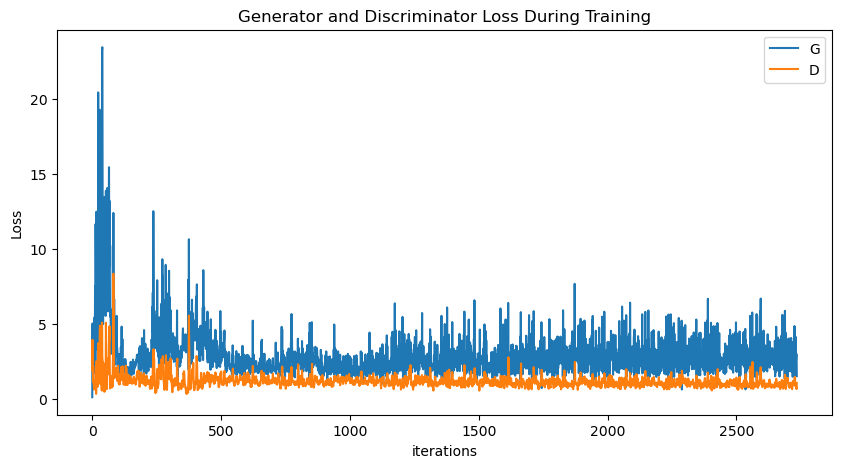

In [174]:
# Loss vs Iteration
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

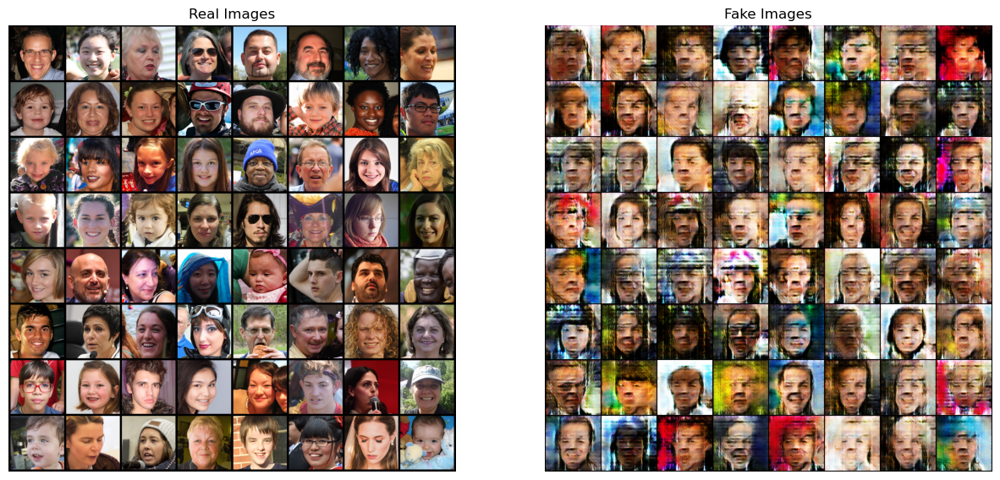

In [175]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


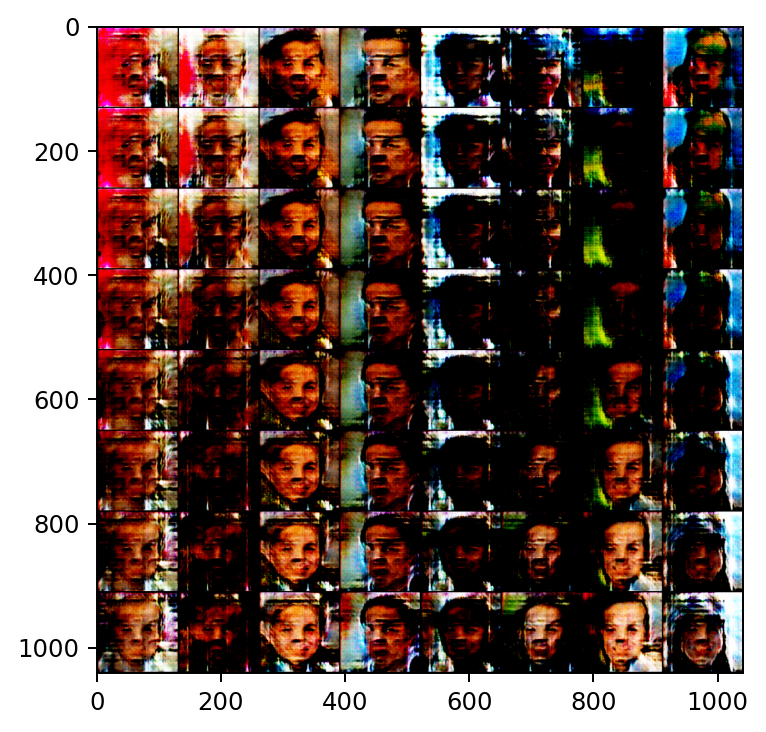

In [216]:
# Linear Interpolation
batch_size = 64
z = torch.randn(64, nz, 1, 1, device=device)
# now show some interpolations (note you do not have to do linear interpolations as shown here, you can do non-linear or gradient-based interpolation if you wish)
col_size = int(np.sqrt(batch_size))

z0 = z[0:col_size].repeat(col_size,1,1,1) # z for top row
z1 = z[batch_size-col_size:].repeat(col_size,1,1,1) # z for bottom row

t = torch.linspace(0,1,col_size).unsqueeze(1).repeat(1,col_size).view(batch_size,1,1,1).to(device)

lerp_z = (1-t)*z0 + t*z1 # linearly interpolate between two points in the latent space
lerp_g = netG(lerp_z) # sample the model at the resulting interpolated latents

plt.rcParams['figure.dpi'] = 175
plt.grid(False)
plt.imshow(vutils.make_grid(lerp_g).cpu().data.permute(0,2,1).contiguous().permute(2,1,0), cmap=plt.cm.binary)
plt.show()

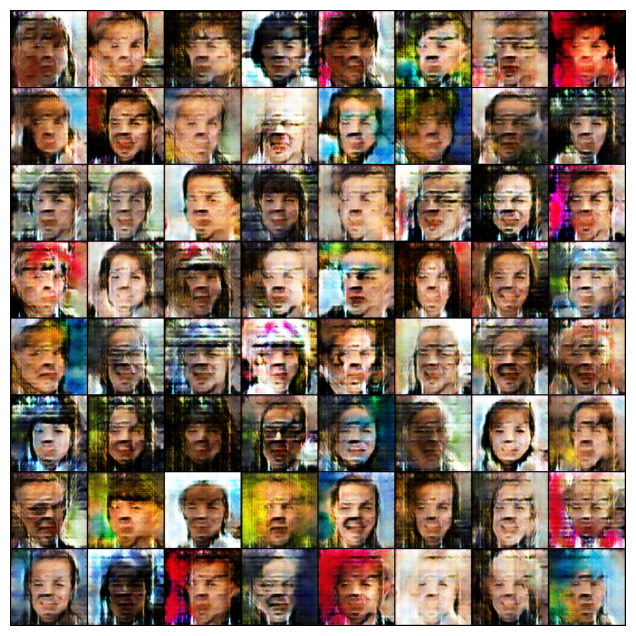

In [176]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

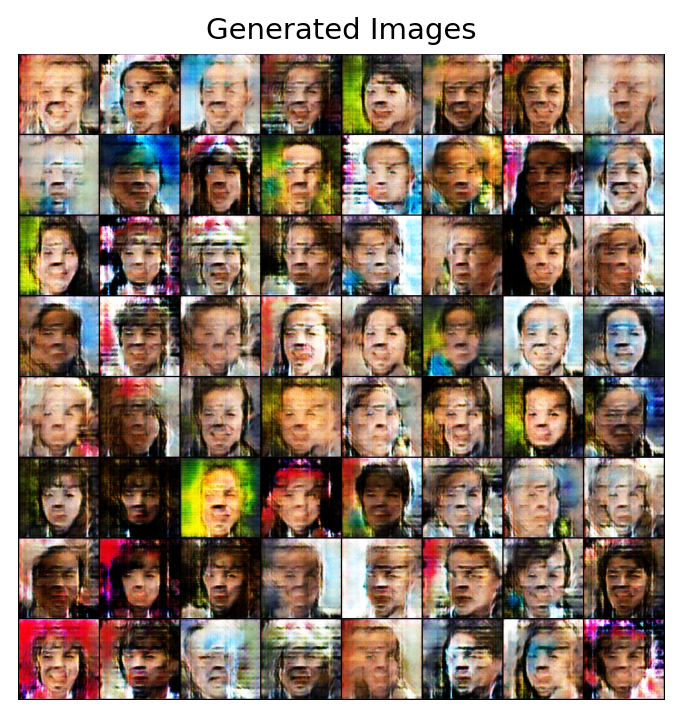

In [225]:
# Generate a batch of fake images
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
image = netG(fixed_noise)
# plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(vutils.make_grid(image.to(device), padding=2, normalize=True).cpu(),(1,2,0)))